In [2]:
# Contrast Stretching
from PIL import Image
import matplotlib.image # can be used instead of Image
import matplotlib.pyplot as plt
# opening the image 
image = Image.open("Images/enstien.jpeg") # type the path of the image in the open function
# summarize some details about the image
print(image.format)
print(image.size)
print(image.mode)
# show the image
plt.imshow(image)

FileNotFoundError: [Errno 2] No such file or directory: 'Images/enstien.jpeg'

In [3]:
# converting the image to array to do the filtering manipulation on it
# importing the numpy library to import asarray function
from numpy import asarray
import numpy as np
image_array = asarray(image)
print(image_array.shape)

NameError: name 'image' is not defined

In [4]:
# there is some default values they are considered from the lecture
def contrast_stretching(image_array, alpha=0, beta=2, y=5, a=42, b=130,y_a=10, y_b=200):
    image_shape = image_array.shape
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    print(vector.flags)
    l = np.amax(image_array)
    for index, x in enumerate(vector):
        if (x>=0 and x<a):
            vector[index] = alpha*x
        elif (x>=a and x<=b):
            vector[index] = (beta*(x-a))+y_a
        elif (x>=b and x<=l):
            vector[index] = (y*(x-b))+y_b
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after

(256, 256)
  C_CONTIGUOUS : True
  F_CONTIGUOUS : True
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False



Text(0.5, 1.0, 'after contrast stretching')

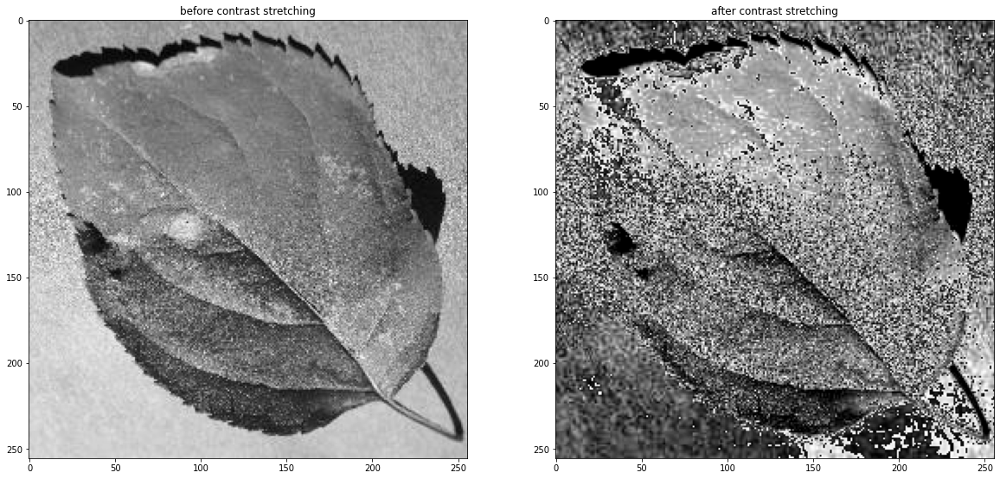

In [8]:
image = Image.open("apple2.JPG").convert("L")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = contrast_stretching(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image after the contrast stretching
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.add_subplot(1, 2, 1)
# showing the image before clipping
plt.imshow(image, cmap="gray")
plt.title("before contrast stretching")
# showing the image after clipping
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap = "gray")
plt.title("after contrast stretching")

In [10]:
# image clipping function
def clipping(image_array, alpha=0, beta=2, y=0, a=42, b=130,y_a=10, y_b=200):
    image_shape = image_array.shape
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    print(vector.flags)
    l = np.amax(image_array)
    for index, x in enumerate(vector):
        if (x>=0 and x<a):
            vector[index] = alpha*x
        elif (x>=a and x<=b):
            vector[index] = (beta*(x-a))+y_a
        elif (x>=b and x<=l):
            vector[index] = y_b
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after
    

(256, 256)
  C_CONTIGUOUS : True
  F_CONTIGUOUS : True
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False



Text(0.5, 1.0, 'after')

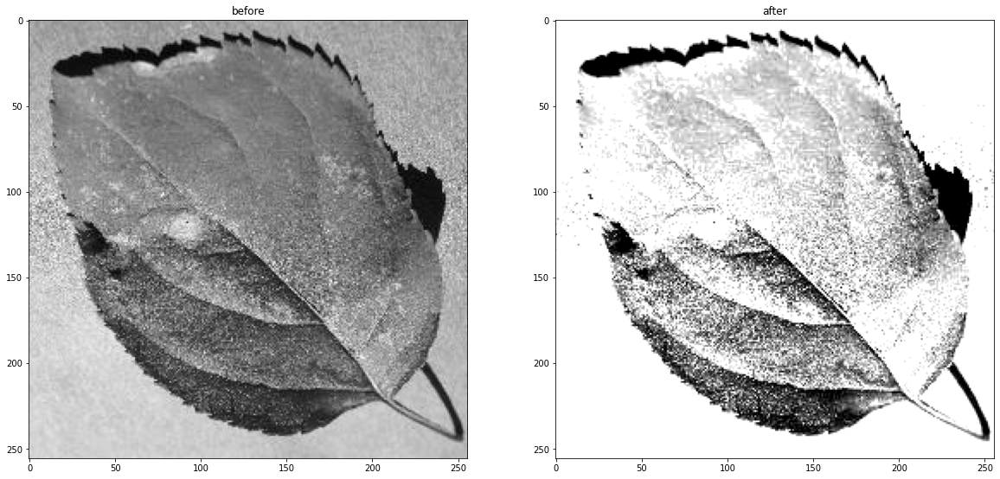

In [11]:
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = clipping(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.add_subplot(1, 2, 1)
# showing the image before clipping
plt.imshow(image, cmap = "gray")
plt.title("before")
# showing the image after clipping
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap = "gray")
plt.title("after")

(256, 256, 3)
  C_CONTIGUOUS : True
  F_CONTIGUOUS : True
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False



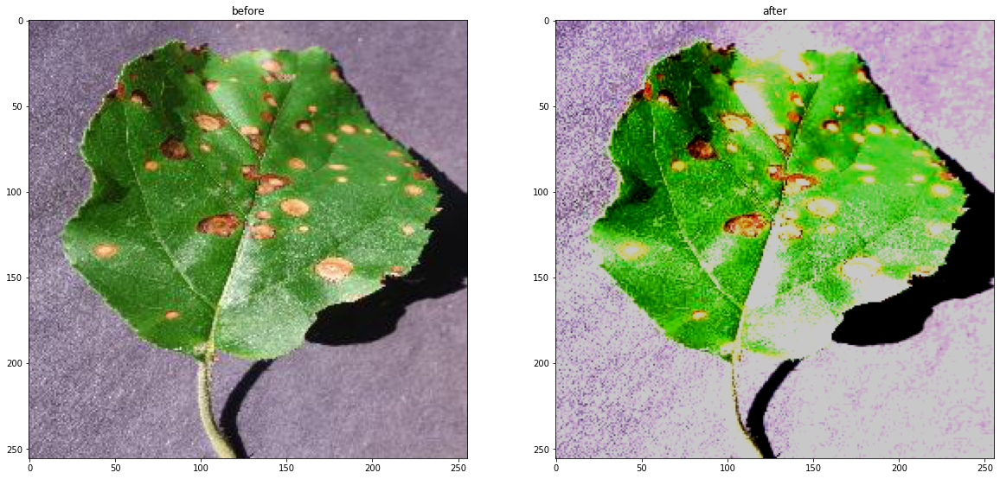

In [12]:
image = Image.open("apple.JPG")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = clipping(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.add_subplot(1, 2, 1)
# showing the image before clipping
plt.imshow(image)
plt.title("before")
# showing the image after clipping
fig.add_subplot(1, 2, 2)
plt.imshow(image_after)
plt.title("after")
image.save("amam_clipping.jpeg")

In [14]:
# range compression
def range_compression(image_array, c):
    image_shape = image_array.shape
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    print(vector.flags)
    #l = np.amax(image_array)
    for index, x in enumerate(vector):
        vector[index] = c*np.log10(1+x)
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after
    

(256, 256, 3)
  C_CONTIGUOUS : True
  F_CONTIGUOUS : True
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False



Text(0.5, 1.0, 'after')

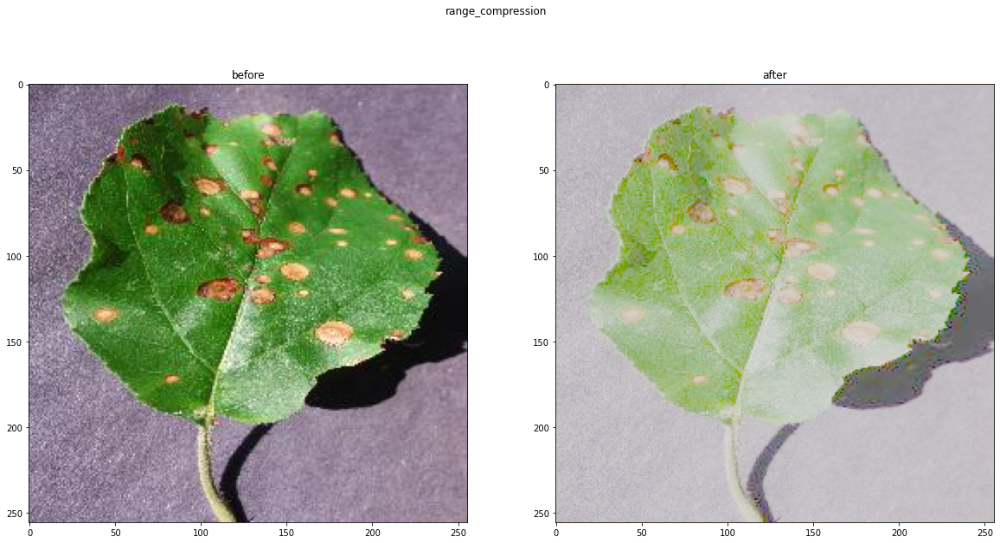

In [15]:
image = Image.open("apple.JPG")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = range_compression(image_array,90)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("range_compression")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")

In [17]:
def power_law(image_array, c, y):
    image_shape = image_array.shape
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    print(vector.flags)
    #l = np.amax(image_array)
    for index, x in enumerate(vector):
        vector[index] = c*255*((x/255)**y) # normalizing the image and doing the formula
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after

(256, 256, 3)
  C_CONTIGUOUS : True
  F_CONTIGUOUS : True
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False



Text(0.5, 1.0, 'after')

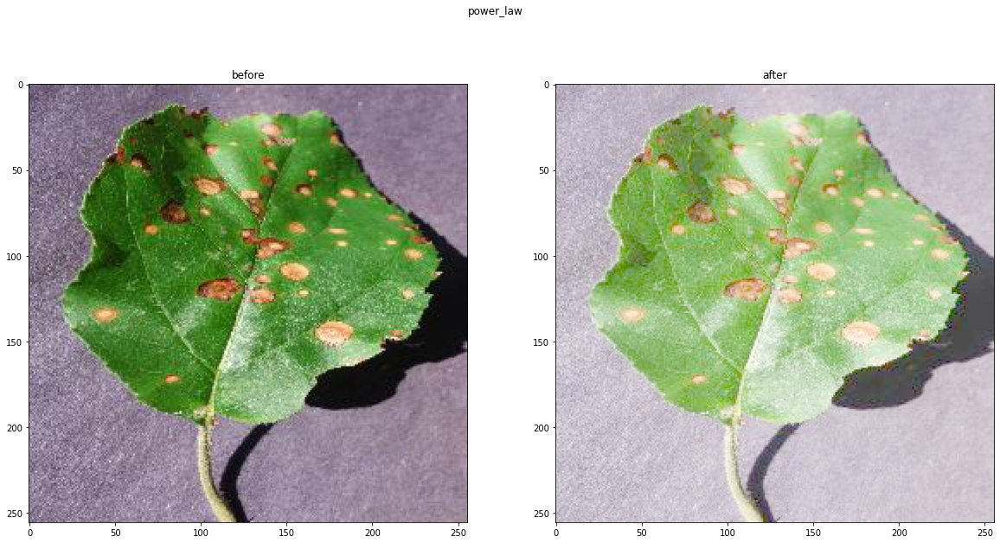

In [18]:
'''it’s not necessary but then you need to adjust the constant c. So,
you can write s=c’*r^y where c’=c/255^y and r range from 0-255(8-bit).
Hope this helps.'''
image = Image.open("apple.JPG")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = power_law(image_array,1,0.4)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("power_law")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")

In [19]:
def log_transformation(image_array):
    image_shape = image_array.shape
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    print(vector.flags)
    l = np.amax(image_array)
    c = 255 / np.log10(1 + l)
    for index, x in enumerate(vector):
        vector[index] = c*np.log(1+x) # normalizing the image and doing the formula
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after

(256, 256, 3)
  C_CONTIGUOUS : True
  F_CONTIGUOUS : True
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False



Text(0.5, 1.0, 'after')

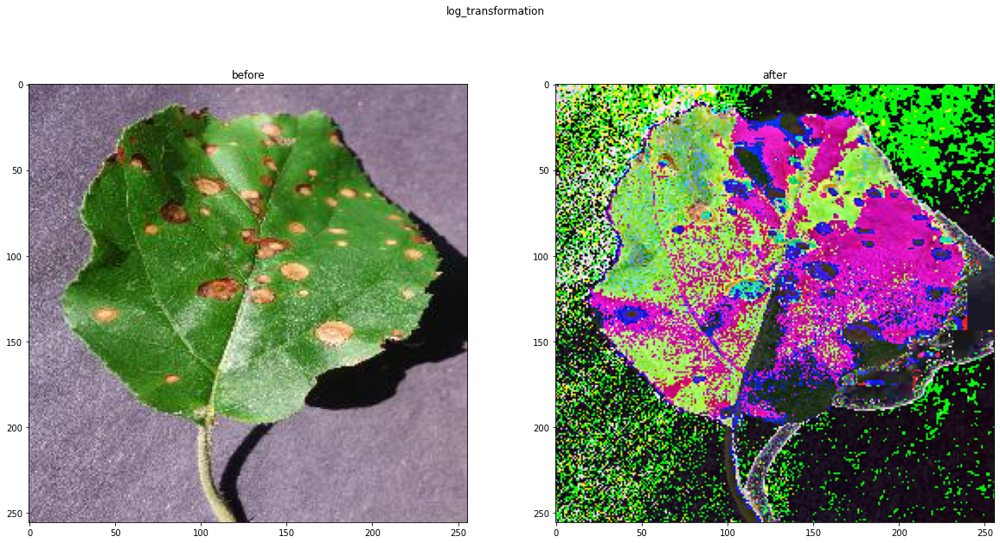

In [23]:
image = Image.open("apple.JPG")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = log_transformation(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("log_transformation")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image)
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")

In [24]:
# histogram stretching
def histogram_stretching(image_array, binary = False):
    max = 255
    min = 0
    # checking if the image is binary
    if binary == True:
        max = 1
    image_shape = image_array.shape
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    print(vector.flags)
    fmax = np.amax(image_array)
    fmin = np.amin(image_array)
    for index, x in enumerate(vector):
        vector[index] = ((x-fmin)/(fmax-fmin))*((max-min)+min) # normalizing the image and doing the formula
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after


(256, 256, 3)
  C_CONTIGUOUS : True
  F_CONTIGUOUS : True
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False



Text(0.5, 1.0, 'after')

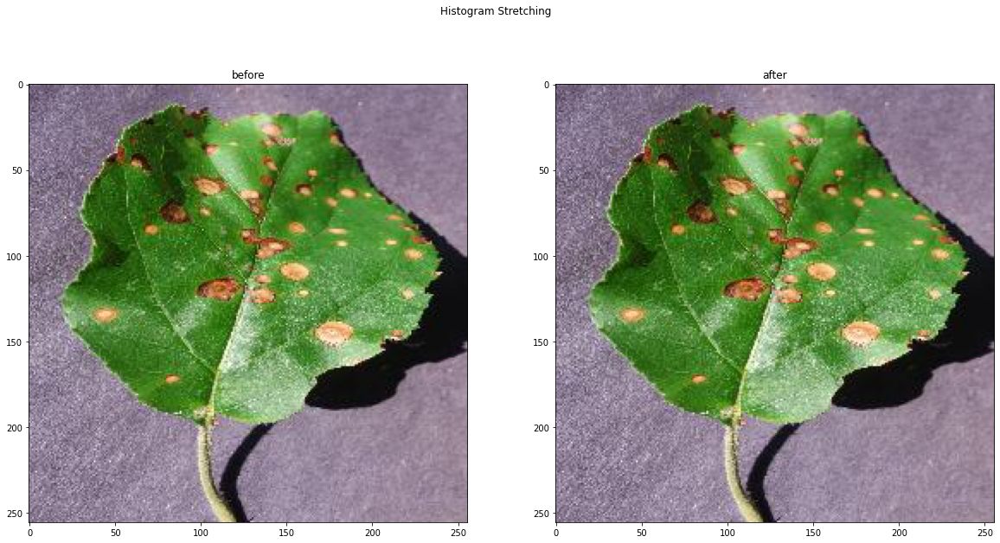

In [26]:
image = Image.open("apple.JPG")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = histogram_stretching(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("Histogram Stretching")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image)
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after)
plt.title("after")

In [27]:
# histogram stretching
def histogram_shrinking(image_array, binary = False):
    max = 255
    min = 0
    # checking if the image is binary
    if binary == True:
        max = 1
    image_shape = image_array.shape
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    print(vector.flags)
    fmax = np.amax(image_array)
    fmin = np.amin(image_array)
    for index, x in enumerate(vector):
        vector[index] = ((max-fmin)/(fmax-fmin))*((x-fmin)+min) # normalizing the image and doing the formula
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after


(256, 256, 3)
  C_CONTIGUOUS : True
  F_CONTIGUOUS : True
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False



Text(0.5, 1.0, 'after')

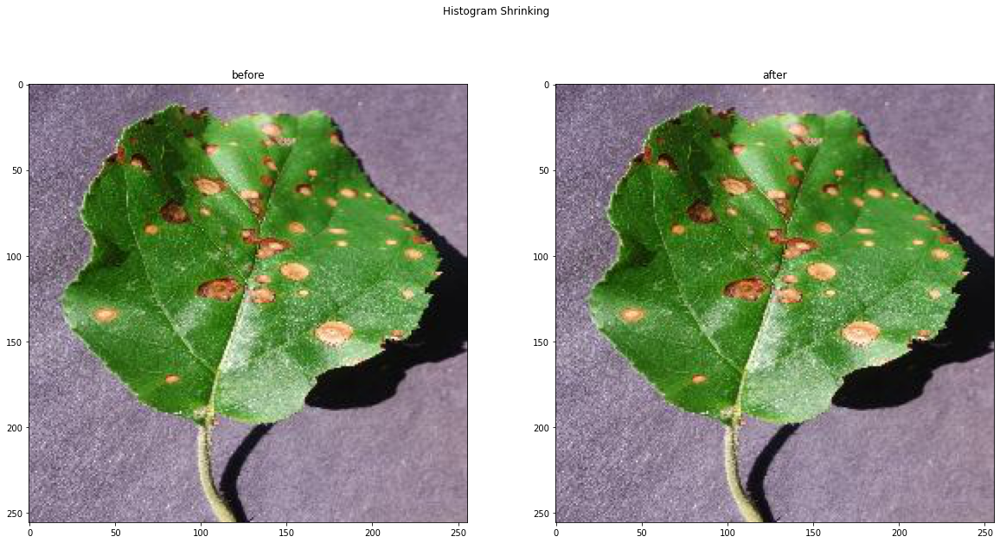

In [28]:
#image = Image.open("Images/old_days.jpg")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = histogram_shrinking(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("Histogram Shrinking")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image)
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after)
plt.title("after")

In [29]:
# 
def median_filter(image_array):
    image_shape = image_array.shape
    # taking the width and height of the image
    width = image_shape[1]
    height = image_shape[0]
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    vector_real = image_array.ravel().copy()
    print(f"before the loop : {len(vector_real)}")
    for index, x in enumerate(vector_real):
        if ((index+1)%width-1!=1 and index%width!=0 and index>width-1 and index<len(vector)-width-1): # aviod edges 2d arrays for median filter
            dim_9_array_to_pixel = np.array([
            vector_real[index-width-1],vector_real[index-width],vector_real[index-width+1],
            vector_real[index-1],vector_real[index],vector_real[index+1]
            ,vector_real[index+width-1],vector_real[index+width],vector_real[index+width+1]])
            median_pixel_value = np.median(dim_9_array_to_pixel) 
            vector[index] = median_pixel_value    
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after

In [30]:
# 
def average_filter(image_array):
    image_shape = image_array.shape
    # taking the width and height of the image
    width = image_shape[1]
    height = image_shape[0]
    # total pixels
    total = width*height
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    vector_real = image_array.ravel().copy()
    print(f"before the loop : {len(vector_real)}")
    counter = 0
    print(vector.flags)
    l = np.amax(image_array)
    for index, x in enumerate(vector_real):
        if ((index+1)%width-1!=1 and index%width!=0 and index>width-1 and index<len(vector)-width-1): # aviod edges 2d arrays for median filter
            dim_9_array_to_pixel = np.array([
            vector_real[index-width-1],vector_real[index-width],vector_real[index-width+1],
            vector_real[index-1],vector_real[index],vector_real[index+1]
            ,vector_real[index+width-1],vector_real[index+width],vector_real[index+width+1]])
            median_pixel_value = np.average(dim_9_array_to_pixel) 
            vector[index] = median_pixel_value
            #vector[index] = 0
            counter += 1
    print(f"after the loop : {counter}")    
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after

(256, 256)
before the loop : 65536
  C_CONTIGUOUS : True
  F_CONTIGUOUS : True
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False

after the loop : 64515


Text(0.5, 1.0, 'after')

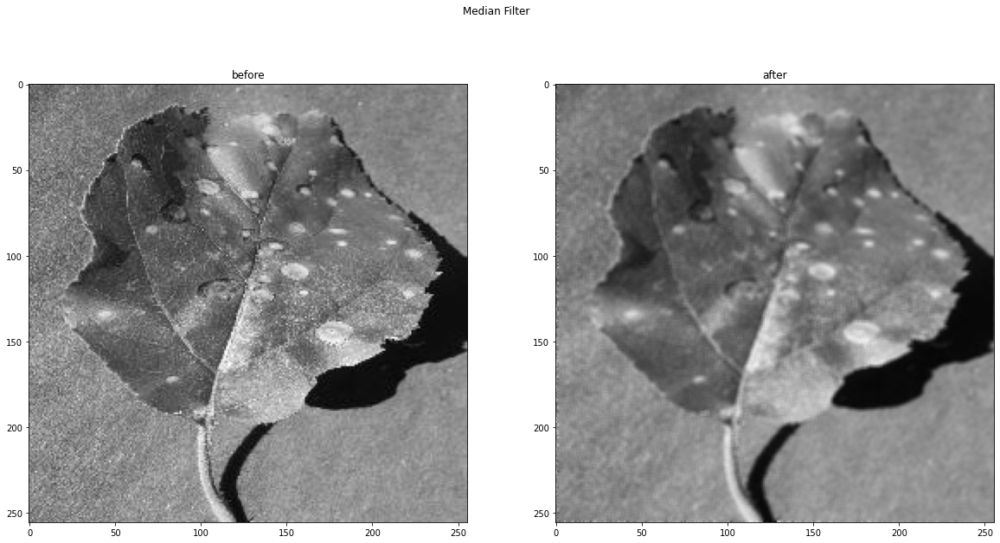

In [33]:
image = Image.open("apple.JPG").convert('L')
# converting image to array
image_array = asarray(image)
# 
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = average_filter(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("Median Filter")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")

(256, 256)
before the loop : 65536
before the loop : 65536


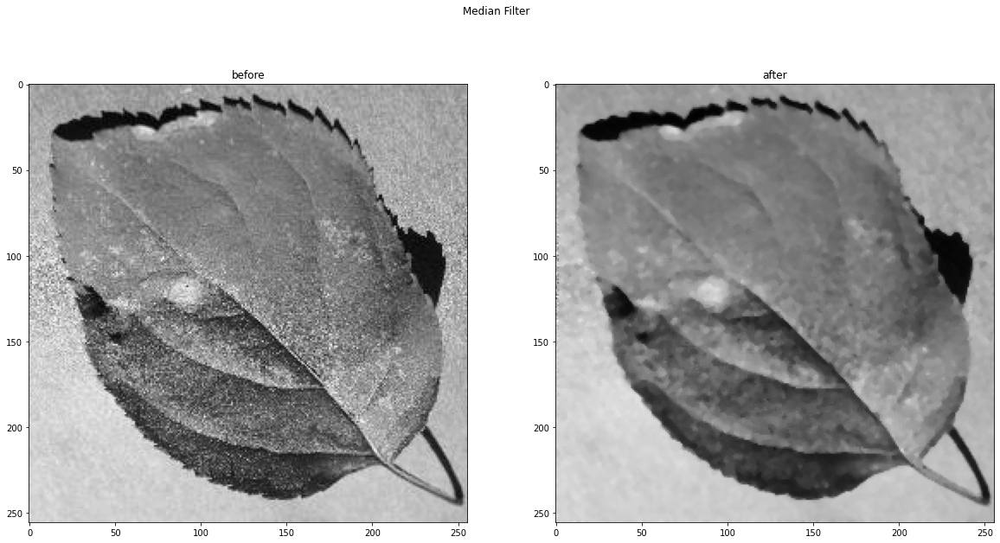

In [72]:
image = Image.open("apple2.JPG").convert('L')
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = median_filter(median_filter(image_array))
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("Median Filter")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")
image_after.save("apple2_median.JPG")
# image_after.save("apple_removeblack_medianapplied.JPG")


(465, 620)
before the loop : 288300
before the loop : 288300


Text(0.5, 1.0, 'after')

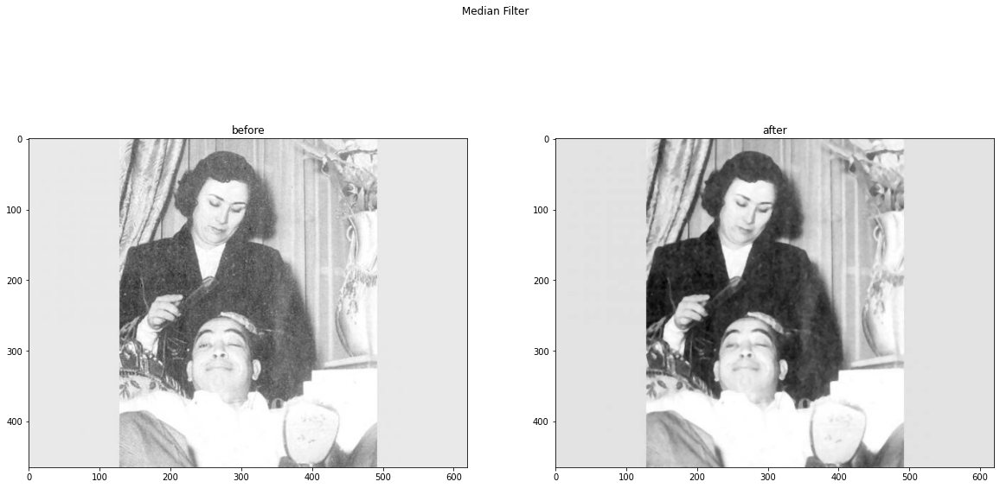

In [23]:
image = Image.open("Images/old_days.jpg").convert('L')
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = median_filter(median_filter(image_array))
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("Median Filter")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")

(256, 256)
before the loop : 65536
before the loop : 65536


Text(0.5, 1.0, 'after')

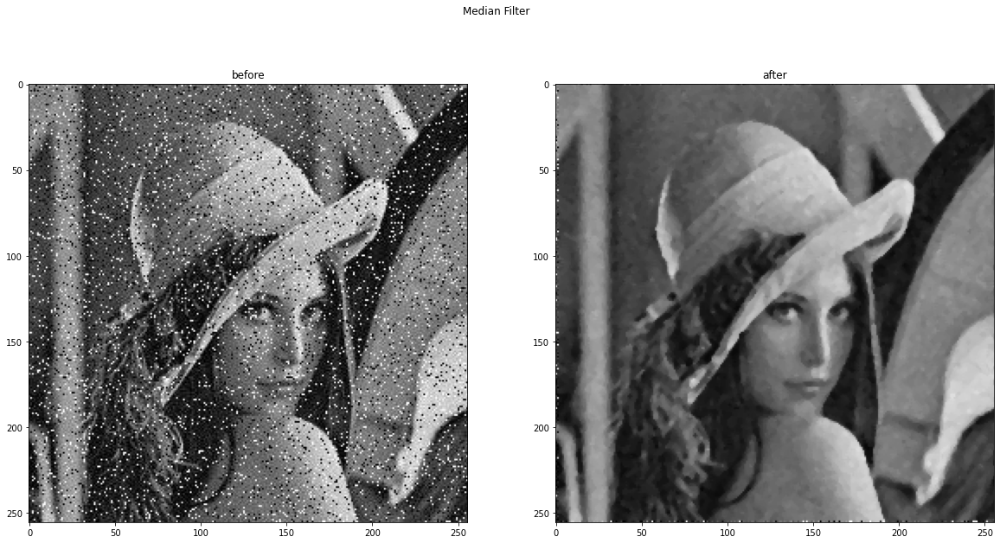

In [24]:
image = Image.open("Images/salt_pepper_image.jpg").convert('L')
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = median_filter(median_filter(image_array))
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("Median Filter")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")

In [25]:
def laplace_sharpen_filter(image_array, c = 1, scaling =False):
    image_shape = image_array.shape
    # taking the width and height of the image
    width = image_shape[1]
    height = image_shape[0]
    # total pixels
    # total = width*height
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    vector_laplace = image_array.ravel().copy()
    vector_real = image_array.ravel().copy()
    print(f"before the loop : {len(vector_real)}")
    counter = 0
    print(vector.flags)
    #l = np.amax(image_array)
    average_value = np.average([vector_real])
    for index, x in enumerate(vector_real):
        if ((index+1)%width-1!=1 and index%width!=0 and index>width-1 and index<len(vector)-width-1): # aviod edges 2d arrays for median filter
            Laplace_law = (vector_real[index+1] + vector_real[index-1]+vector_real[index-width]+vector_real[index+width]) - (4*vector_real[index])
            if(scaling==True):
               vector_laplace[index] = Laplace_law - average_value
            else:
               vector_laplace[index] = Laplace_law
            if (vector_laplace[index] < 0):
               vector[index] =  vector[index] - Laplace_law
            else: 
               vector[index] =  vector[index] + Laplace_law
            #vector[index] =           #vector[index] = 0
    print(f"after the loop : {counter}")    
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    laplace = np.asarray(vector_laplace).reshape(image_shape)
    return image_array_after, laplace

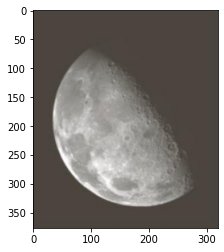

In [26]:
image = Image.open("Images/moon.png")
plt.imshow(image, cmap = "gray")

(222, 227)
before the loop : 50394
  C_CONTIGUOUS : True
  F_CONTIGUOUS : True
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False



/tmp/ipykernel_24213/90549654.py:20: RuntimeWarning: overflow encountered in ubyte_scalars
  Laplace_law = (vector_real[index+1] + vector_real[index-1]+vector_real[index-width]+vector_real[index+width]) - (4*vector_real[index])


after the loop : 0


Text(0.5, 1.0, 'after')

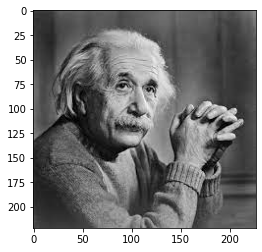

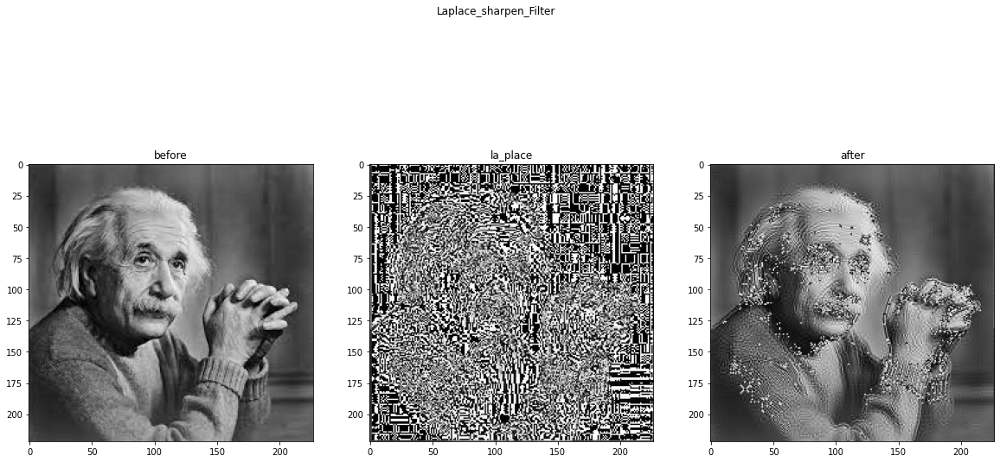

In [27]:
from skimage import color
#color.rgb2gray(io.imread('image.png'))
image = Image.open("Images/enstien.jpeg").convert("L")
#image = color.rgb2gray(image)
real_image = Image.open("Images/enstien.jpeg")
plt.imshow(real_image)
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after, laplace_image = laplace_sharpen_filter(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("Laplace_sharpen_Filter")
fig.add_subplot(1, 3, 1)
# showing the image before range compression\
plt.title("before")
plt.imshow(image, cmap="gray")
fig.add_subplot(1, 3, 2)
# # showing the image before range compression
plt.imshow(laplace_image, cmap="gray")
plt.title("la_place")
# showing the image after range compression
fig.add_subplot(1, 3, 3)
plt.imshow(image_after, cmap = "gray")
plt.title("after")

(256, 256)
before the loop : 65536
  C_CONTIGUOUS : True
  F_CONTIGUOUS : True
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False



/tmp/ipykernel_24213/90549654.py:20: RuntimeWarning: overflow encountered in ubyte_scalars
  Laplace_law = (vector_real[index+1] + vector_real[index-1]+vector_real[index-width]+vector_real[index+width]) - (4*vector_real[index])


after the loop : 0


Text(0.5, 1.0, 'after')

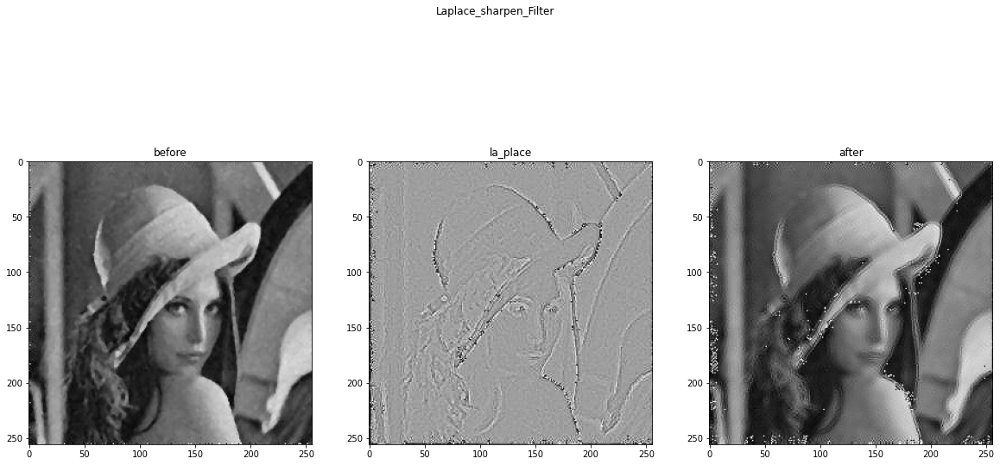

In [28]:
image = Image.open("Images/girl_with_hat.jpg")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after, laplace_image = laplace_sharpen_filter(image_array,scaling=True)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("Laplace_sharpen_Filter")
fig.add_subplot(1, 3, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
fig.add_subplot(1, 3, 2)
# # showing the image before range compression
plt.imshow(laplace_image, cmap="gray")
plt.title("la_place")
# showing the image after range compression
fig.add_subplot(1, 3, 3)
plt.imshow(image_after, cmap="gray")
plt.title("after")

In [73]:
import cv2
#Apply log transformation method   s=c*log(1+r )   
#  input intenisity level  r 
# Read an image
image = cv2.imread('apple2.jpg')
c=1
v = c*255/ np.log( np.max(1+image*255)) # 255 for normalization
log_image = v * (np.log(image ))
# Specify the data type   
log_image = np.array(log_image, dtype = np.uint8)
# Display both images
fig = plt.figure(figsize=(20,10))
fig.add_subplot(1,2,1)
fig.suptitle("Log Tranfrom")
plt.imshow(image)
plt.title("before")
print("log transformation")
fig.add_subplot(1,2,2)
print("\n"+"after\t log transformation")
plt.imshow(log_image)
plt.title("after")

TypeError: unsupported operand type(s) for *: 'NoneType' and 'int'

log transformation

after	 log transformation


Text(0.5, 1.0, 'after')

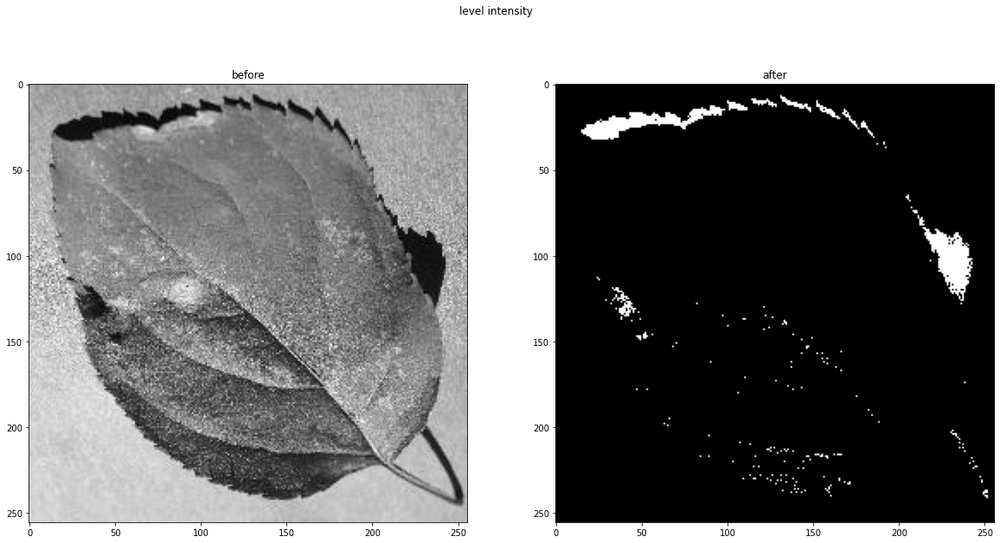

In [74]:
import cv2
#level intensity scaling good for bones
# Load the image
img1 = cv2.imread('apple2.JPG',0)
# Find width and height of image

row, column = img1.shape
# Specify the min and max range
min_range = 1
max_range = 30
im=img1.copy()
# Loop over the input image and if pixel value lies in desired range set it to 255 otherwise set it to 0.
for i in range(row):
    for j in range(column):
        if img1[i,j]>min_range and img1[i,j]<max_range:
            img1[i,j] = 255
        else:
            img1[i,j] = 0
# Display the image
fig = plt.figure(figsize=(20,10))
fig.add_subplot(1,2,1)
fig.suptitle("level intensity")
plt.imshow(im,cmap="gray")
plt.title("before")
print("log transformation")
fig.add_subplot(1,2,2)
print("\n"+"after\t log transformation")
plt.imshow(img1,cmap="gray")
plt.title("after")

In [31]:
# there is some default values they are considered from the lecture
def image_negtive(image_array):
    image_shape = image_array.shape
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    # print(vector.flags)
    # l = np.amax(image_array)
    for index, x in enumerate(vector):
        vector[index] = 255 -  x # x is the value of vector at the giving index
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after

(222, 227)


Text(0.5, 1.0, 'after')

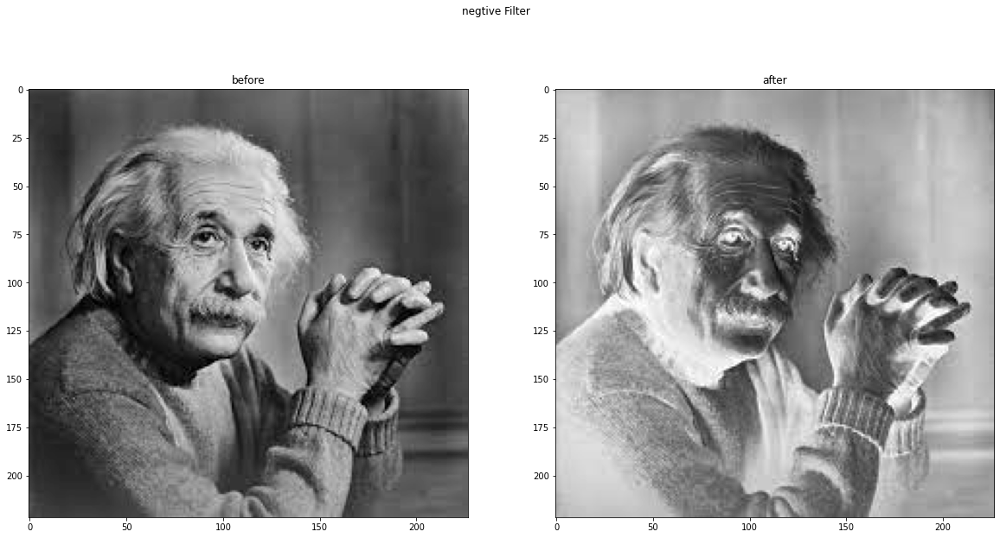

In [32]:
image = Image.open("Images/enstien.jpeg").convert('L')
# converting image to array
image_array = np.asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = image_negtive(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("negtive Filter")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")

In [33]:
def gates(gate, ifalse, itrue, inone, intwo):
    if gate == "and" :
        out = inone and intwo
        return binary_boolean(out, ifalse, itrue)
    elif gate == "or":
        out = inone or intwo
        return binary_boolean(out, ifalse, itrue) 
    elif gate == "xor":
        out = XOR(inone, intwo)
        return binary_boolean(out, ifalse, itrue)
    elif gate == "not":
        out = not inone
        return binary_boolean(out, ifalse, itrue)
def binary_boolean(out, ifalse, itrue):
    if out == True:
        return itrue
    else:
        return ifalse
def XOR (a, b):
    if a != b:
        return True
    else:
        return False
def convert_from_boolean(input, high, low):
    if input == True: return high
    elif input == False: return low
def convert_to_boolean(input_pixal, high, low):
    if input_pixal >= high:
        return True
    elif input_pixal <= low:
        return False

In [34]:
# there is some default values they are considered from the lecture
def image_operations(operation, image_array_1, image_array_2 = 1, high = 255, low = 0):
    print(f"image shape 1 :{image_array_1.shape}")
    print(f"image shape 2 :{image_array_2.shape}")    
    image_shape_1 = image_array_1.shape
    image_shape_2 = image_array_2.reshape(image_shape_1)
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector_image_1 = image_array_1.ravel().copy()
    vector_image_2 = image_array_2.ravel().copy()
    vector_image = image_array_1.ravel().copy()
    #l = np.amax(image_array)
    for index, x in enumerate(vector_image):
        image1_pixal = convert_to_boolean(vector_image_1[index], high, low) 
        image2_pixal = convert_to_boolean(vector_image_2[index], high, low)
        vector_image[index] = gates(gate = operation, itrue= high, ifalse=low,inone = image1_pixal,intwo=image2_pixal)
        
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector_image).reshape(image_shape_1)
    return image_array_after

(222, 227)
image shape 1 :(250, 499)
image shape 2 :(250, 499)


Text(0.5, 1.0, 'after')

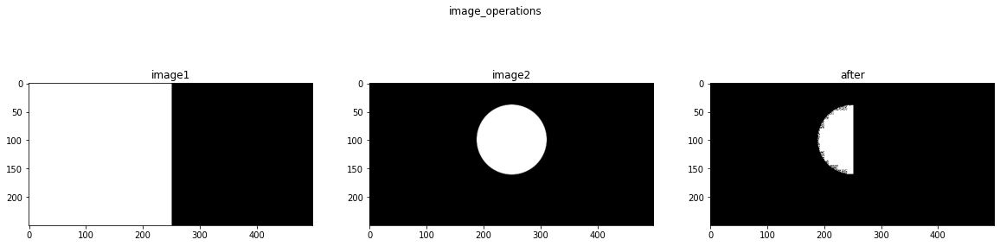

In [35]:
image1 = Image.open("Images/image1.jpeg").convert('L')
image2 = Image.open("Images/image2.jpeg").convert('L')
# converting image to array
image_array_1 = np.asarray(image1)
image_array_2 = np.asarray(image2)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = image_operations("and",image_array_1, image_array_2)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,5))
fig.suptitle("image_operations")
fig.add_subplot(1, 3, 1)
# showing the image 1
plt.imshow(image1, cmap="gray")
plt.title("image1")
# showing the image 2 
fig.add_subplot(1, 3, 2)
plt.imshow(image2, cmap="gray")
plt.title("image2")
# showing the image after
fig.add_subplot(1, 3, 3)
plt.imshow(image_after, cmap="gray")
plt.title("after")

True

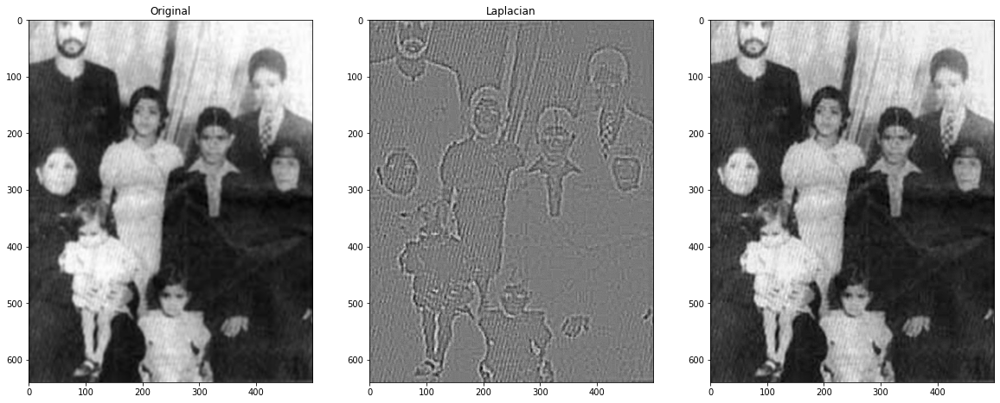

In [48]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# loading image
#img0 = cv2.imread('SanFrancisco.jpg',)
#img0 = cv2.imread('amam_clipping.jpeg')
img0 = cv2.imread("Images/amam_before_final.jpg")
#plt.figure(figsize = (20,6))
#plt.imshow(img0)

# converting to gray scale
gray = cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY)

# remove noise
img = cv2.GaussianBlur(gray,(3,3),0)
# convolute with proper kernels
laplacian = cv2.Laplacian(img,cv2.CV_64F)
laplace_image = img - laplacian
fig = plt.figure(figsize=(20, 10))
fig.add_subplot(1,3,1),plt.imshow(img,cmap = 'gray')
plt.title('Original')
fig.add_subplot(1,3,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian')
fig.add_subplot(1,3,3)
plt.imshow(laplace_image,cmap = 'gray')
cv2.imwrite("Images/final.jpg", laplace_image)

(640, 500, 3)
  C_CONTIGUOUS : True
  F_CONTIGUOUS : True
  OWNDATA : True
  WRITEABLE : True
  ALIGNED : True
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False

before the loop : 320000


Text(0.5, 1.0, 'laplace')

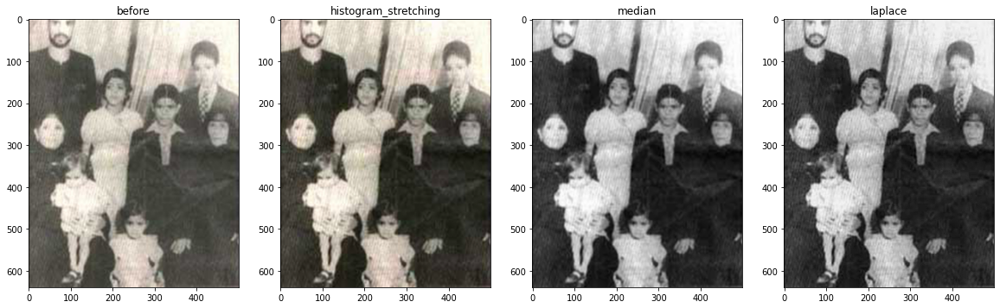

In [49]:
#
image = Image.open("Images/Elsharawy_family.jpg")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = histogram_stretching(image_array)
image_for_median = Image.fromarray(image_array_after).convert("L")
median = median_filter(asarray(image_for_median))
median = Image.fromarray(median)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,20))
fig.add_subplot(1, 4, 1)
# showing the image before clipping
plt.imshow(image)
plt.title("before")
# showing the image after clipping
fig.add_subplot(1, 4, 2)
plt.imshow(image_after)
plt.title("histogram_stretching")
fig.add_subplot(1, 4, 3)
plt.imshow(median, cmap = "gray")
plt.title("median")
fig.add_subplot(1, 4, 4)
median.save("Images/amam_before_final.jpg")
plt.imshow(laplace_image, cmap = "gray")
plt.title("laplace")

In [40]:
# 
def sopel_filter(image_array):
    image_shape = image_array.shape
    # taking the width and height of the image
    width = image_shape[1]
    height = image_shape[0]
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    vector_real = image_array.ravel().copy()
    print(f"before the loop : {len(vector_real)}")
    for index, x in enumerate(vector_real):
        if ((index+1)%width-1!=1 and index%width!=0 and index>width-1 and index<len(vector)-width-1): # aviod edges 2d arrays for median filter
            z_list = np.array([
            vector_real[index-width-1],vector_real[index-width],vector_real[index-width+1],
            vector_real[index-1],vector_real[index],vector_real[index+1]
            ,vector_real[index+width-1],vector_real[index+width],vector_real[index+width+1]])
            sopel_pixel_value = abs((z_list[6]+(2*z_list[7])+z_list[8])-(z_list[0]+(2*z_list[1])+z_list[2]))+abs((z_list[2]+(2*z_list[5])+z_list[8])-(z_list[0]+(2*z_list[3])+z_list[6]))
            vector[index] = sopel_pixel_value    
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after

(256, 256)
before the loop : 65536


Text(0.5, 1.0, 'after')

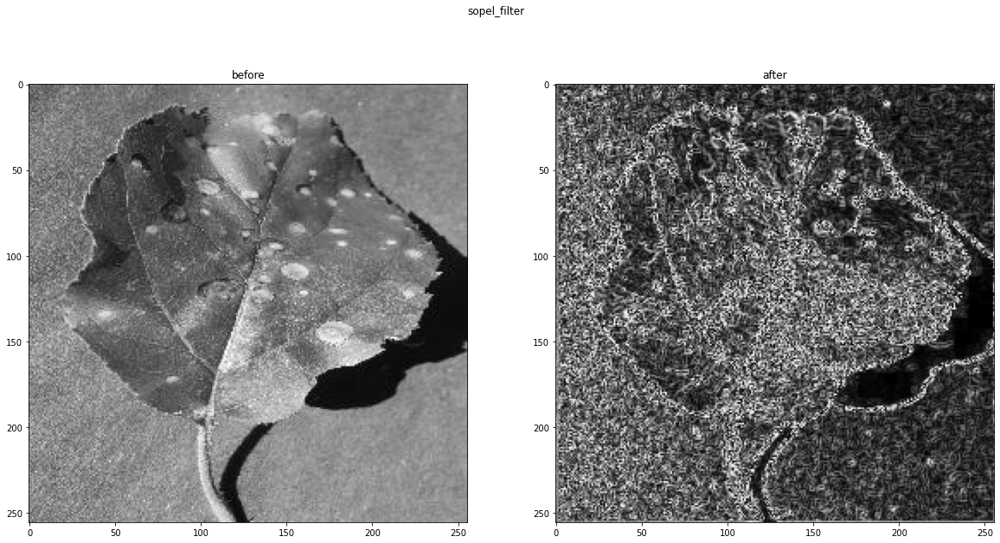

In [41]:
image = Image.open("apple.JPG").convert("L")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = sopel_filter(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("sopel_filter")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")

In [40]:
# 
def correlation_filter(image_array,mask):
    image_shape = image_array.shape
    # taking the width and height of the image
    width = image_shape[1]
    height = image_shape[0]
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    vector_real = image_array.ravel().copy()
    print(f"before the loop : {len(vector_real)}")
    for index, x in enumerate(vector_real):
        if ((index+1)%width-1!=1 and index%width!=0 and index>width-1 and index<len(vector)-width-1): # aviod edges 2d arrays for median filter
            z_list = np.array([
            vector_real[index-width-1],vector_real[index-width],vector_real[index-width+1],
            vector_real[index-1],vector_real[index],vector_real[index+1]
            ,vector_real[index+width-1],vector_real[index+width],vector_real[index+width+1]])
            correlation_pixal_value = (mask[0]*z_list[0]+mask[1]*z_list[1]+mask[2]*z_list[2]+mask[3]*z_list[3]+mask[4]*z_list[4]+mask[5]*z_list[5]+mask[6]*z_list[6]+mask[6]*z_list[6]+mask[7]*z_list[7]+mask[8]*z_list[8])
            vector[index] = correlation_pixal_value    
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after

(256, 256)
before the loop : 65536


Text(0.5, 1.0, 'after')

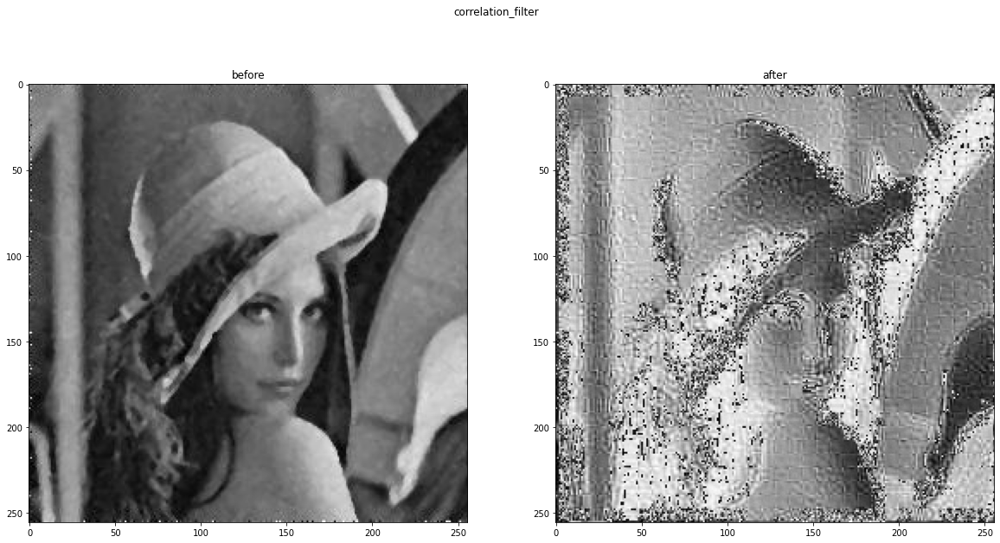

In [41]:
image = Image.open("Images/girl_with_hat.jpg").convert("L")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = correlation_filter(image_array, mask = [-1,-1,-1,-1,8,-1,-1,-1,-1])
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("correlation_filter")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")

In [42]:
# 
def max_filter(image_array):
    image_shape = image_array.shape
    # taking the width and height of the image
    width = image_shape[1]
    height = image_shape[0]
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    vector_real = image_array.ravel().copy()
    print(f"before the loop : {len(vector_real)}")
    for index, x in enumerate(vector_real):
        if ((index+1)%width-1!=1 and index%width!=0 and index>width-1 and index<len(vector)-width-1): # aviod edges 2d arrays for median filter
            dim_9_array_to_pixel = np.array([
            vector_real[index-width-1],vector_real[index-width],vector_real[index-width+1],
            vector_real[index-1],vector_real[index],vector_real[index+1]
            ,vector_real[index+width-1],vector_real[index+width],vector_real[index+width+1]])
            median_pixel_value = np.max(dim_9_array_to_pixel) 
            vector[index] = median_pixel_value    
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after

(256, 256)
before the loop : 65536


Text(0.5, 1.0, 'after')

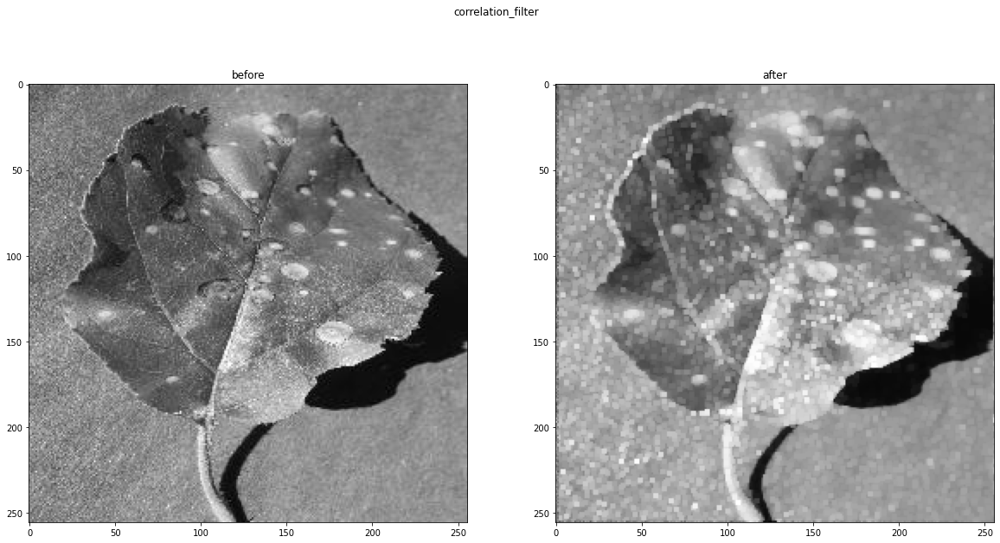

In [46]:
image = Image.open("apple.JPG").convert("L")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = max_filter(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("correlation_filter")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")


In [44]:
# 
def min_filter(image_array):
    image_shape = image_array.shape
    # taking the width and height of the image
    width = image_shape[1]
    height = image_shape[0]
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    vector = image_array.ravel().copy()
    vector_real = image_array.ravel().copy()
    print(f"before the loop : {len(vector_real)}")
    for index, x in enumerate(vector_real):
        if ((index+1)%width-1!=1 and index%width!=0 and index>width-1 and index<len(vector)-width-1): # aviod edges 2d arrays for median filter
            dim_9_array_to_pixel = np.array([
            vector_real[index-width-1],vector_real[index-width],vector_real[index-width+1],
            vector_real[index-1],vector_real[index],vector_real[index+1]
            ,vector_real[index+width-1],vector_real[index+width],vector_real[index+width+1]])
            median_pixel_value = np.min(dim_9_array_to_pixel) 
            vector[index] = median_pixel_value    
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after

In [47]:
image = Image.open("Images/girl_with_hat.jpg").convert("L")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = min_filter(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("correlation_filter")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")

FileNotFoundError: [Errno 2] No such file or directory: 'Images/girl_with_hat.jpg'

In [67]:
def remove_black(image_array):
    image_shape = image_array.shape
    # taking the width and height of the image
    width = image_shape[1]
    height = image_shape[0]
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    # find the highest black value
    vector = image_array.ravel().copy()
    min = np.min(vector)
    vector_real = image_array.ravel().copy()
    print(f"before the loop : {len(vector_real)}")
    for index, x in enumerate(vector_real):
        if x>min and x<26:
            vector[index] = 141
        else:
            vector[index] = x
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after

(256, 256)
before the loop : 65536


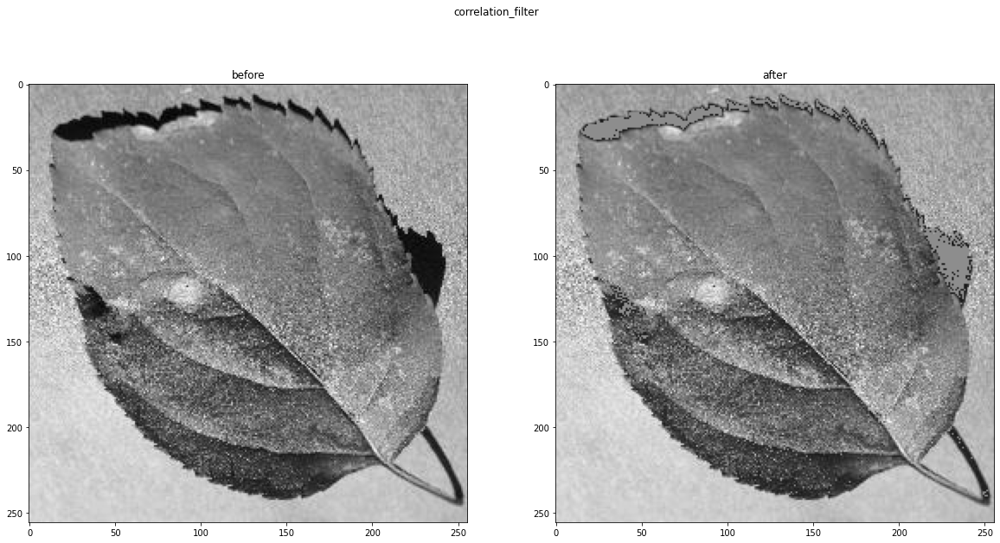

In [84]:
image = Image.open("apple2.JPG").convert("L")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = remove_black(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("correlation_filter")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")
image_after.save("apple2_removeblack.JPG")

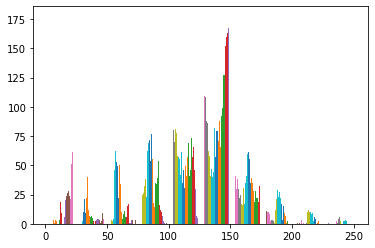

In [109]:
# plotting the histogram of the image
image = Image.open("apple.JPG").convert("L")
# converting image to array
image_array = asarray(image)
plt.hist(image_array)
plt.show()

In [147]:
# getting the mean of each distribution
def group_values(image_array):
    # adding the values for each 25 values near each others
    values_dict = count_array_val(image_array)
    new_array = []
    sum = []
    for key, value in values_dict.items():
        if counter < 2:
            sum.append(value)
        else:
            new_array.append(np.average(sum))
            counter = 0
            sum.clear() 
        counter +=1
    return new_array

# counting the values
def count_array_val(image_array):
    vector = image_array.ravel().copy()
    dictionary = {}
    for value in vector:
        if value in dictionary.keys():
            dictionary[value] +=1
        else:
            dictionary[value] = 1
    return dictionary
def get_average(dictionary, step=25,state = "graph"): # step for number of nearby grayscale values
    # this function should return the dictionary of keys 
    # where keys are the tuple of start and end grayscale values
    # that we started calculating the average in between
    # first we sort the keys
    counter = 0
    average_dict = {}
    start = 0
    end = 0
    sum = 0
    for key in sorted(dictionary.keys()):
        counter +=1
        if counter == 1 :
            # saving the grayscale value where we started calcualting this average 
            start = key 
            
        if counter < step:
            sum += dictionary[key]
        else:
            # saving the to the average_dict
            end = key
            if state == "graph":
                average_dict["{}-{}".format(start, end)] = sum # (start,end)
            else:
                 average_dict[(start,end)] = sum # (start,end)
            counter = 0
            sum = 0
            
    return average_dict

def get_range(tuple):
    print(tuple)
    start, end = tuple
    return range(start,end+1)
def make_list_of_ranges(dictionary):
    # considering that the input dictionary keys are 
    # tuples
    range_dict = {}
    for key in dictionary.keys():
        start, end = key
        average = int(start+end/2)
        range_dict[average] = get_range(key)

    return range_dict
def make_list_of_ranges_from_imagearray(image_array):
    # will return range_list
    return make_list_of_ranges(get_average(count_array_val(image_array),state="nothing"))


{'0-24': 3145, '25-49': 1636, '50-74': 3874, '75-99': 7479, '100-124': 12461, '125-149': 21190, '150-174': 9196, '175-199': 2721, '200-224': 997, '225-249': 268}


<BarContainer object of 10 artists>

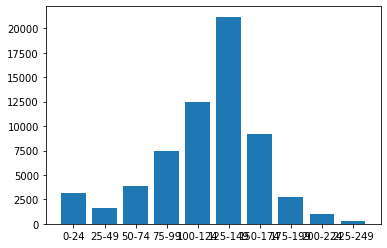

In [149]:
# plotting the histogram of the image
image = Image.open("apple.JPG").convert("L")
# converting image to array
image_array = asarray(image)
average_dict = get_average(count_array_val(image_array))
print(average_dict)
plt.bar(average_dict.keys(), average_dict.values())

In [148]:
# plotting the histogram of the image
image = Image.open("apple.JPG").convert("L")
# converting image to array
image_array = asarray(image)
range_dict = make_list_of_ranges_from_imagearray(image_array)
print(range_dict)

(0, 24)
(25, 49)
(50, 74)
(75, 99)
(100, 124)
(125, 149)
(150, 174)
(175, 199)
(200, 224)
(225, 249)
{12: range(0, 25), 49: range(25, 50), 87: range(50, 75), 124: range(75, 100), 162: range(100, 125), 199: range(125, 150), 237: range(150, 175), 274: range(175, 200), 312: range(200, 225), 349: range(225, 250)}


In [151]:
def limit_colors_in_array(image_array):
    image_shape = image_array.shape
    range_dict = make_list_of_ranges_from_imagearray(image_array)
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    # find the highest black value
    vector = image_array.ravel().copy()
    average = np.average(vector)
    vector_real = image_array.ravel().copy()
    for index, x in enumerate(vector_real):
        for average,range in range_dict.items():
            if x in range:
                vector_real[index] = average
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector_real).reshape(image_shape)
    return image_array_after

(256, 256)
(0, 24)
(25, 49)
(50, 74)
(75, 99)
(100, 124)
(125, 149)
(150, 174)
(175, 199)
(200, 224)
(225, 249)


Text(0.5, 1.0, 'after')

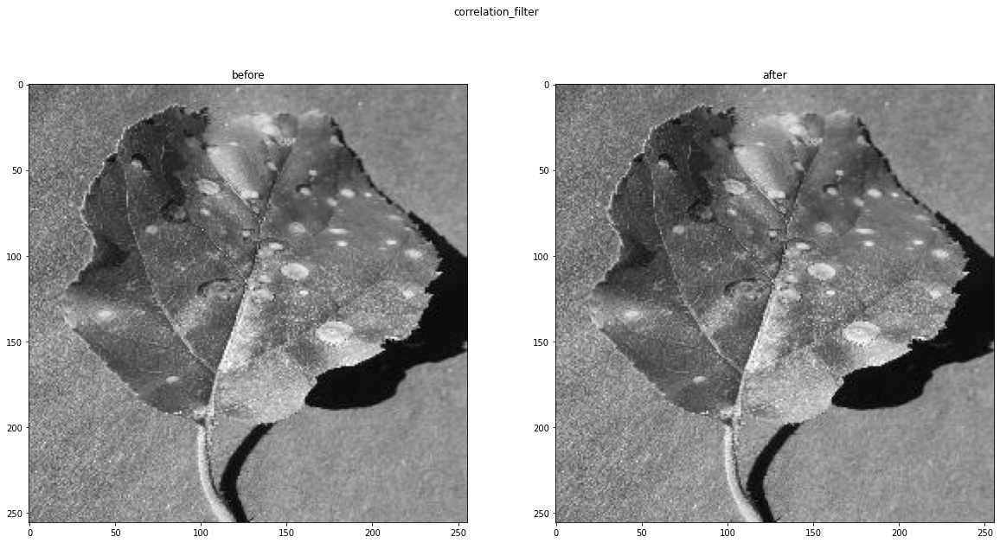

In [152]:
image = Image.open("apple.JPG").convert("L")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = limit_colors_in_array(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("limit_colors_filter")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")

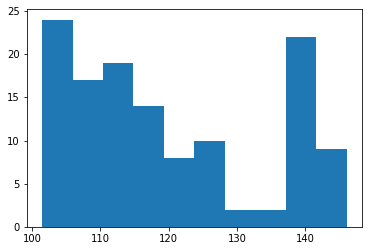

In [98]:
# plotting the histogram of the image
image = Image.open("apple.JPG").convert("L")
# converting image to array
image_array = asarray(image)
image_array = group_values(image_array)
plt.hist(image_array)
plt.show()

In [77]:
def super_contrast(image_array):
    image_shape = image_array.shape
    # taking the width and height of the image
    width = image_shape[1]
    height = image_shape[0]
    # converting the image to a vector to ease the computations
    # make a 1-dimensional view of arr
    # find the highest black value
    vector = image_array.ravel().copy()
    average = np.average(vector)
    vector_real = image_array.ravel().copy()
    print(f"before the loop : {len(vector_real)}")
    for index, x in enumerate(vector_real):
        if x>average:
            vector[index] = 255
        else:
            vector[index] = 0
    # converting the vector back to the shape of the image
    image_array_after = np.asarray(vector).reshape(image_shape)
    return image_array_after

(256, 256)
before the loop : 65536


Text(0.5, 1.0, 'after')

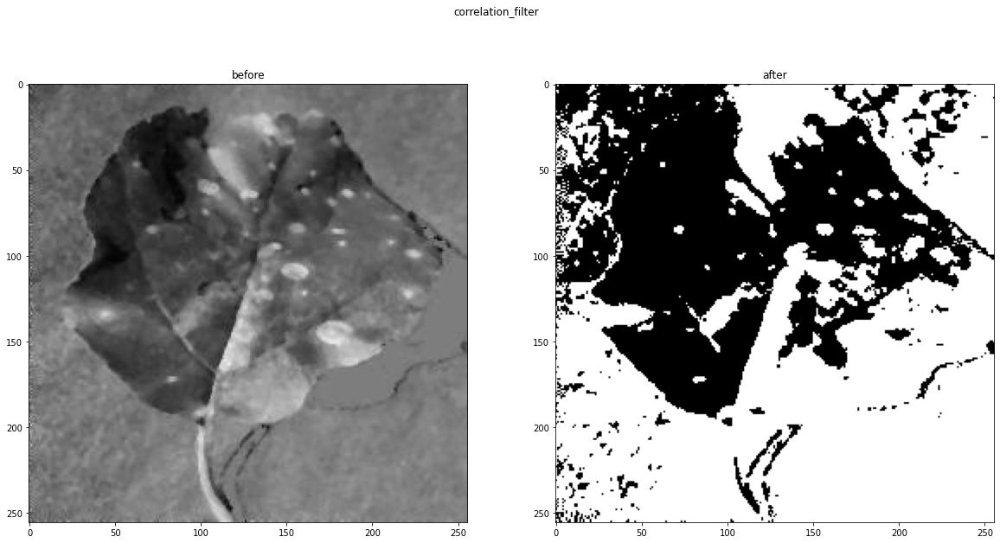

In [85]:
image = Image.open("apple_removeblack_medianapplied.JPG").convert("L")
# converting image to array
image_array = asarray(image)
# showing the shape of the image
print(image_array.shape)
# doing the clipping filter on the image array
image_array_after = super_contrast(image_array)
# converting the image back from the array
image_after = Image.fromarray(image_array_after)
# showing the image before and after the operations
fig = plt.figure(figsize=(20,10))
fig.suptitle("correlation_filter")
fig.add_subplot(1, 2, 1)
# showing the image before range compression
plt.imshow(image, cmap="gray")
plt.title("before")
# showing the image after range compression
fig.add_subplot(1, 2, 2)
plt.imshow(image_after, cmap="gray")
plt.title("after")